In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [16]:
def plot_images(*imgs, figsize=(30,20), hide_ticks=False):
    f = plt.figure(figsize=figsize)
    width = np.ceil(np.sqrt(len(imgs)))
    width = int(width)
    height = np.ceil(len(imgs) / width)
    height = int(height) 
    for i, img in enumerate(imgs, 1):
        ax = f.add_subplot(height, width, i)
        if hide_ticks:
            ax.axis('off')
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

Load images.

In [104]:
left = cv2.imread('1.jpg')
right = cv2.imread('2.jpg')

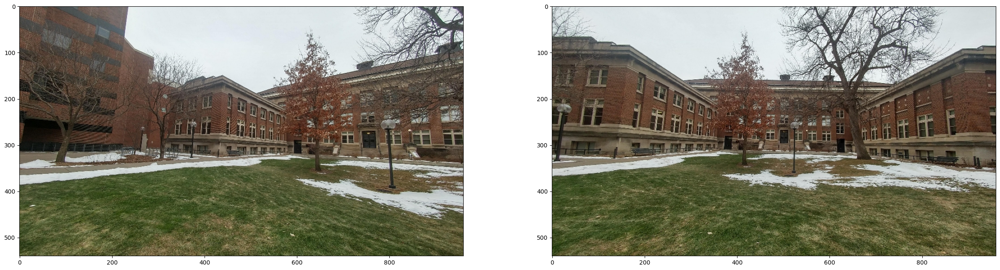

In [105]:
plot_images(left, right)

In [106]:
sift = cv2.SIFT_create()

In [107]:
kp_left, des_left = sift.detectAndCompute(left, None)
kp_right, des_right = sift.detectAndCompute(right, None)

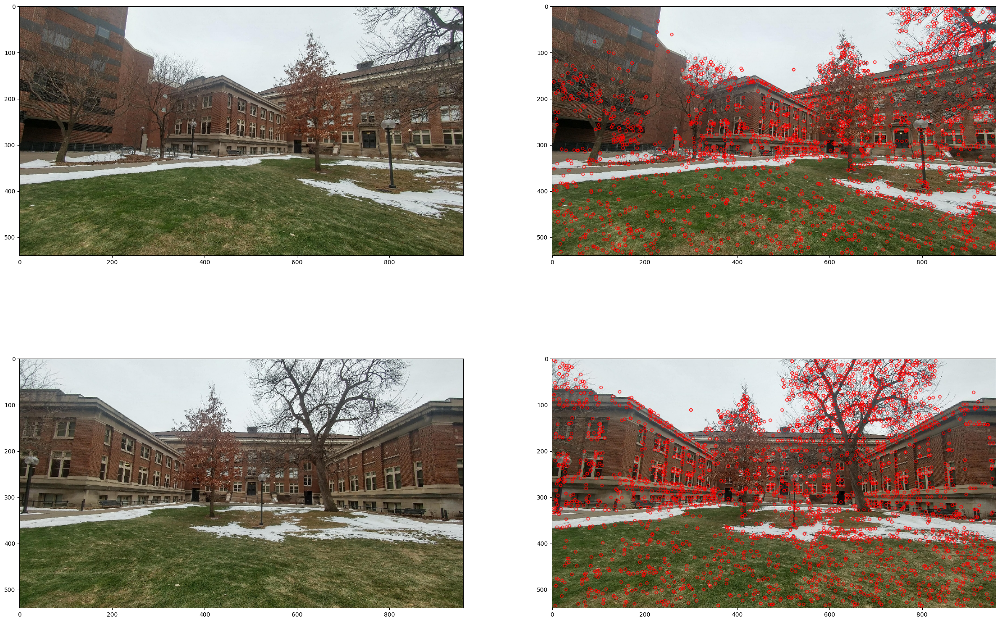

In [108]:
keypoints_drawn_left = cv2.drawKeypoints(left, kp_left, None, color=(0, 0, 255))
keypoints_drawn_right = cv2.drawKeypoints(right, kp_right, None, color=(0, 0, 255))

plot_images(left, keypoints_drawn_left, right, keypoints_drawn_right)

In [109]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des_left,des_right)

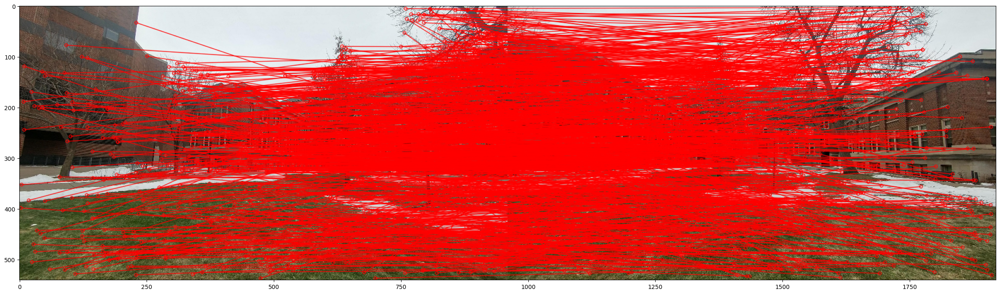

In [110]:
matches_drawn = cv2.drawMatches(left, kp_left, right, kp_right, matches, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(matches_drawn)

In [116]:
flann = cv2.FlannBasedMatcher()
flann_matches_knn = flann.knnMatch(des_left, des_right, k=2)
good_matches = []
for m, n in flann_matches_knn:
    if m.distance < 0.6*n.distance:
        good_matches.append(m)
print(len(good_matches))

117


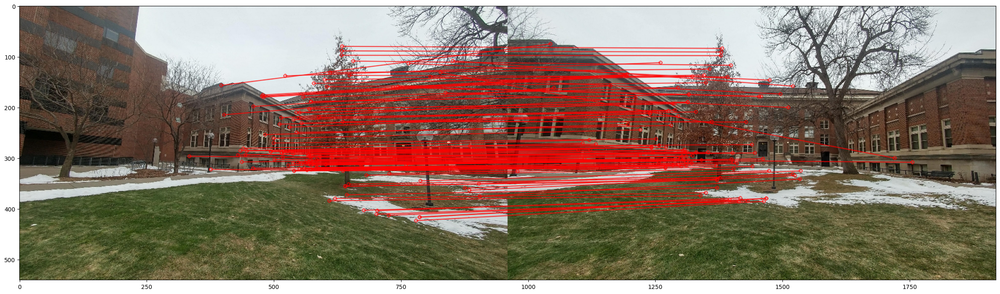

In [117]:
flann_match2 = cv2.drawMatches(left, kp_left, right, kp_right, good_matches, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plot_images(flann_match2)

In [118]:
left_pts = []
right_pts = []
for m in good_matches:
    l = kp_left[m.queryIdx].pt
    r = kp_right[m.trainIdx].pt
    left_pts.append(l)
    right_pts.append(r)

In [119]:
M, _ = cv2.findHomography(np.float32(right_pts), np.float32(left_pts))

In [143]:
M

array([[ 9.74932657e-01, -2.66815492e-01,  3.01764523e+02],
       [ 1.25604319e-02,  8.66333447e-01,  3.08065539e+01],
       [ 3.49050838e-04, -5.83516572e-04,  1.00000000e+00]])

In [120]:
dim_x = left.shape[1] + right.shape[1]
dim_y = max(left.shape[0], right.shape[0])
dim = (dim_x, dim_y)
warped_left = cv2.warpPerspective(left, M, dim)
warped_right = cv2.warpPerspective(left, M, dim)

In [145]:
imgs = [left, right]

def sticth_with_crop_eh(imgs):
    stitcher = cv2.Stitcher.create()
    status, stitched_panorama = stitcher.stitch(imgs)  
    if status == cv2.Stitcher_OK:
        stitched_cropped = cv2.copyMakeBorder(stitched_panorama, 10, 10, 10, 10,
                                            cv2.BORDER_CONSTANT, (0, 0, 0))
        gray = cv2.cvtColor(stitched_cropped, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour = max(contours, key=cv2.contourArea)
        mask = np.zeros(thresh.shape, dtype="uint8")
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)
        minRect = mask.copy()
        sub = mask.copy()
        while cv2.countNonZero(sub) > 0:
            minRect = cv2.erode(minRect, None)
            sub = cv2.subtract(minRect, thresh)
        contours, _ = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(contour)
        stitched_final = stitched_cropped[y:y + h, x:x + w]

        plt.figure(figsize=(8, 6))
        plt.imshow(cv2.cvtColor(stitched_final, cv2.COLOR_BGR2RGB))
        plt.title("Cropped and Blended Stitched Panorama")
        plt.axis("off")
        plt.show()

    else:
        print("Stitching failed!")
    

Your Panorama is ready !! crazy


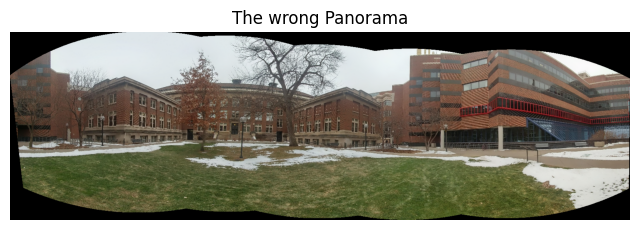

In [138]:
image_paths=['1.jpg','2.jpg','3.jpg', '4.jpg','5.jpg','6.jpg', '7.jpg','8.jpg'] 
imgs = [] 
  
for i in range(len(image_paths)): 
    imgs.append(cv2.imread(image_paths[i]))
stitchy=cv2.Stitcher.create() 
(dummy,output)=stitchy.stitch(imgs) 
  
if dummy != cv2.STITCHER_OK: 
    print("stitching ain't successful meh") 
else:  
    print('Your Panorama is ready !! crazy') 

plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title("The wrong Panorama")
plt.axis("off")
plt.show()


Stitching failed!


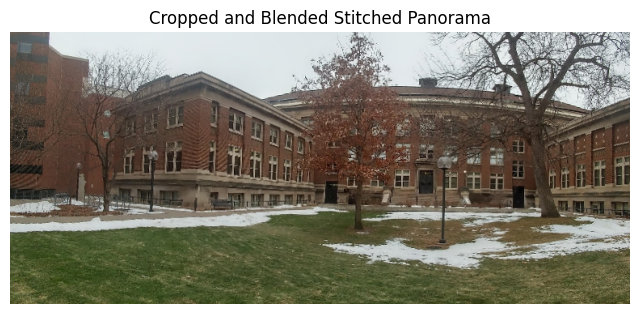

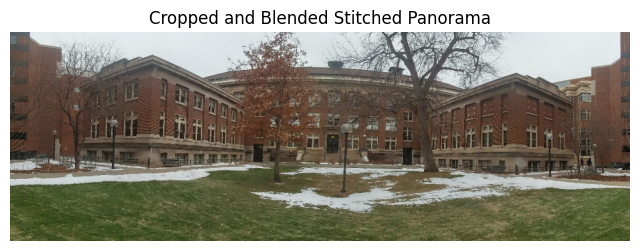

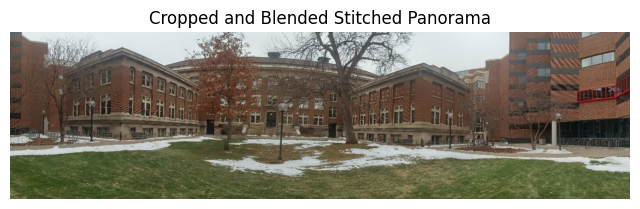

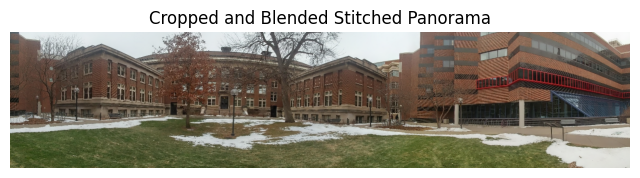

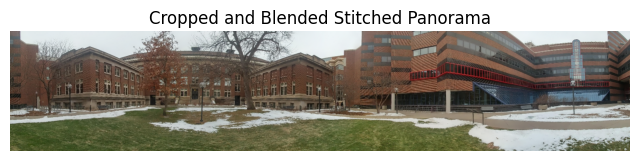

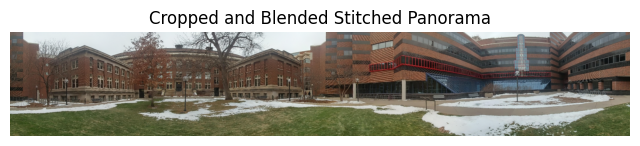

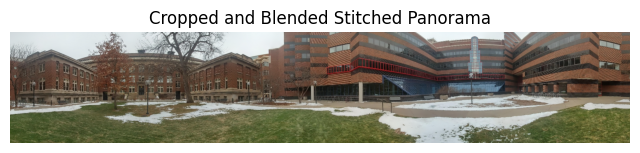

In [149]:


image_paths = ['1.jpg','2.jpg','3.jpg', '4.jpg','5.jpg','6.jpg', '7.jpg','8.jpg']

for i in range(len(image_paths)):
    imgs = [cv2.imread(path) for path in image_paths[:i+1]]
    sticth_with_crop_eh(imgs)


In [77]:
cv2.__version__

'4.8.1'